In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

def imread_and_grayscale(fname,lib='cv2'):
    """
    Utility to read and return img's and grayscaled images using cv2 or mpimg
    """
    if lib == 'cv2':
        _img = cv2.imread(fname)
        _gray = cv2.cvtColor(_img,cv2.COLOR_BGR2GRAY)
    else:
        _img = mpimg.imread(fname)
        _gray = cv2.cvtColor(_img,cv2.COLOR_RGB2GRAY)        
    return _img,_gray

def calibrate(calibration_images_path,nx,ny,lib='mpimg'):
    """
    Given a path to the calibration (chessboard) images, and grid size
    returns the object and image points necessary for distortion correction
    """

    objpoints = []
    imgpoints = []

    objp = np.zeros((ny*nx,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Make a list of calibration images
    images = glob.glob(calibration_images_path)

    print('calibrating...')
    for fname in images:
        img,gray = imread_and_grayscale(fname,'mpimg')

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, draw corners
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

    print('calibrating...done')
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)

    return objpoints,imgpoints,ret, mtx, dist, rvecs, tvecs

def cal_undistort(img, mtx, dist):
    """
    Given object and image points, and image - returns a corrected image
    """
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

In [4]:
def abs_sobel_thresh(gray, orient='x', sobel_kernel = 3, thresh_min=0, thresh_max=255):
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def mag_thresh(gray, sobel_kernel=9, mag_thresh=(0, 255)):
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(gray, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(abs_sobely,abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return binary_output


def hsv_select(img):
    """
    Given RGB image, transforms to HSV color space and 
    returns a binary image after applying 3 masks: threshold on V, yellow, white
    """
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    
    yellow_low = np.array([0, 100, 100])
    yellow_high = np.array([50, 255, 255])
    mask_yellow = cv2.inRange(hsv, yellow_low, yellow_high)
    sensitivity = 35
    
    white_low = np.array([20, 0, 180]) 
    white_high = np.array([255, 80, 255])
    mask_white = cv2.inRange(hsv, white_low, white_high)
    
    mask = cv2.bitwise_or(mask_yellow, mask_white)
    binary_output = np.zeros_like(mask)
    binary_output[((v_channel >= 220) & (v_channel <= 255)) | (mask >0)] = 1
    return binary_output

def hls_select(img, thresh=(0, 255)):
    """
    applies filters on s channel and white filter
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    
    white_low = np.array([0,195,0])
    white_high = np.array([255,255,60])
    mask_white = cv2.inRange(hls, white_low,white_high )
    
    binary_output[((s_channel > thresh[0]) & (s_channel <= thresh[1])) | (mask_white > 0)] = 1
    
    return binary_output

def color_select(img):
    """
    applies red and white filters
    """
    r_channel = img[:,:,0]
    binary_output = np.zeros_like(r_channel)

    white_low = np.array([200,200,200])
    white_high = np.array([255,255,255])
    mask_white = cv2.inRange(img, white_low,white_high )
    
    binary_output[((r_channel >= 220) & (r_channel <= 255)) | (mask_white > 0)] = 1
    
    return binary_output
    
def region_of_interest(img,vert):
    """
    Applies an image mask. From Udacity Self-Driving Car Nanodegree project 1
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    ignore_mask_color = (255,) * 3
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vert, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def histogram_equalize(img):
    r,g,b = cv2.split(img)
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((red, green, blue))

def pipeline(img):
    """
    Pipeline for Color and Gradient thresholding
    1. HSV + HLS + Color Thresholding
    2. Region of Interest Masking
    """
    img = np.copy(img)

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #img = histogram_equalize(img)
    # Apply each of the thresholding functions
    #gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh_min=30,thresh_max=255)
    #grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=3, thresh_min=30,thresh_max=255)
    #mag_binary = mag_thresh(gray, sobel_kernel=9, mag_thresh=(30, 255))
    #dir_binary = dir_threshold(gray, sobel_kernel=15, thresh=(0.65, 1.15))

    #combined_gradient = np.zeros_like(gradx)
    #combined_gradient[(gradx == 1)] = 1 #& (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # HLS thresholding
    s_binary = hls_select(img,thresh=(170, 255))
    
    # HSV Thresholding
    hsv_binary = hsv_select(img)    
    
    # Color Thresholding
    red_white_binary = color_select(img)
    
    # Combined Masks
    combined_binary = s_binary | hsv_binary | red_white_binary
    
    # Masking
    imshape = img.shape
    outer_1 = (0, imshape[0])
    outer_2 = (615, 400)
    outer_3 = (675, 400)
    outer_4 = (imshape[1], imshape[0])

    inner_1 = (350, imshape[0])
    inner_2 = (650,475)
    inner_3 = (700,475)
    inner_4 = (1150, imshape[0])

    vertices = np.array([[outer_1, outer_2, outer_3, outer_4,
             inner_4, inner_3, inner_2, inner_1]], dtype=np.int32)

    masked_image = region_of_interest(combined_binary,vertices)

    return masked_image

In [3]:
# Calibrate
objpoints,imgpoints,ret, mtx, dist, rvecs, tvecs = calibrate(calibration_images_path='camera_cal/*',nx=9,ny=6,lib='mpimg')


calibrating...
calibrating...done


# Save Undistorted Images


True

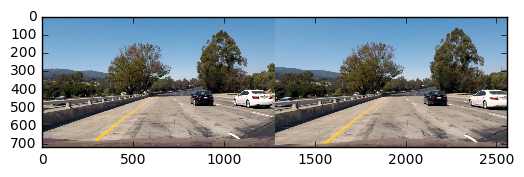

In [5]:
img,gray = imread_and_grayscale('test_images/test1.jpg',lib='mpimg')
undistorted = cal_undistort(img,mtx,dist)
vis = np.concatenate((img, undistorted), axis=1)
plt.imshow(vis)
cv2.imwrite('./output_images/undistort_test1.png', vis)

True

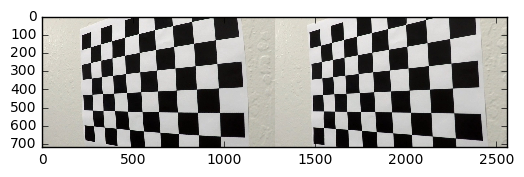

In [6]:
img,gray = imread_and_grayscale('camera_cal/calibration4.jpg',lib='mpimg')
undistorted = cal_undistort(img,mtx,dist)
vis = np.concatenate((img, undistorted), axis=1)
plt.imshow(vis)
cv2.imwrite('./output_images/undistort_output.png', vis)

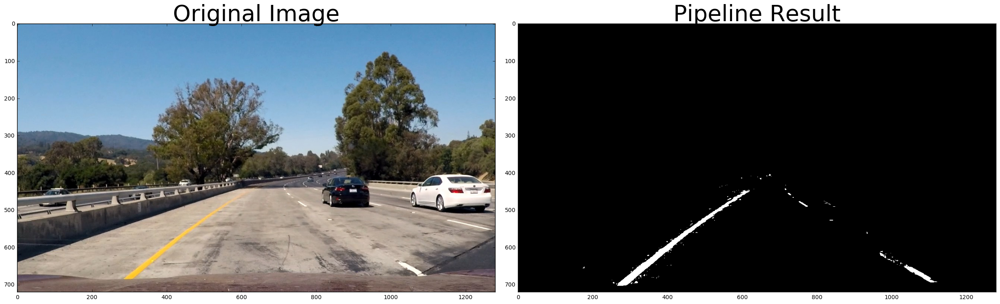

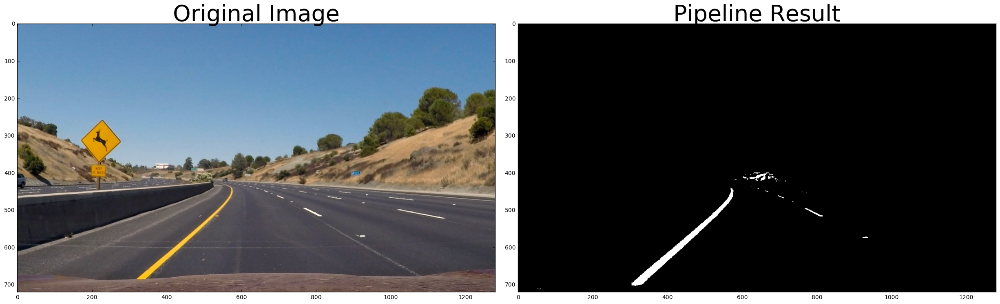

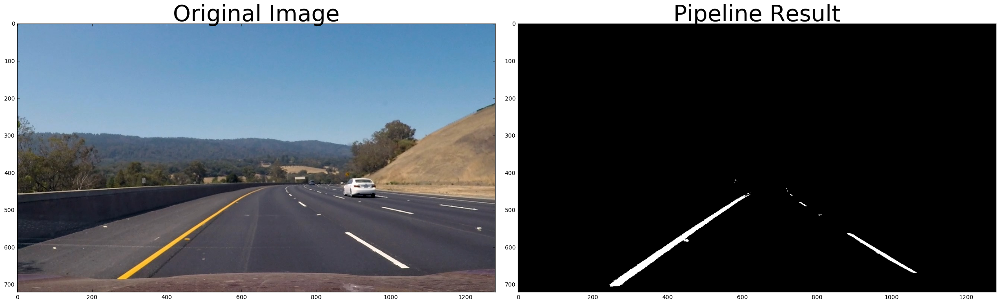

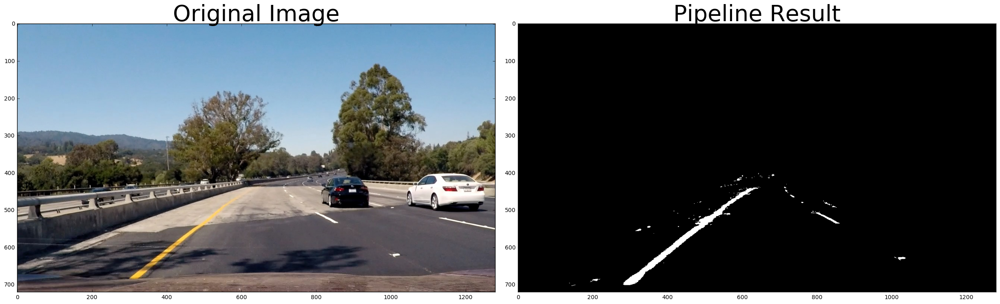

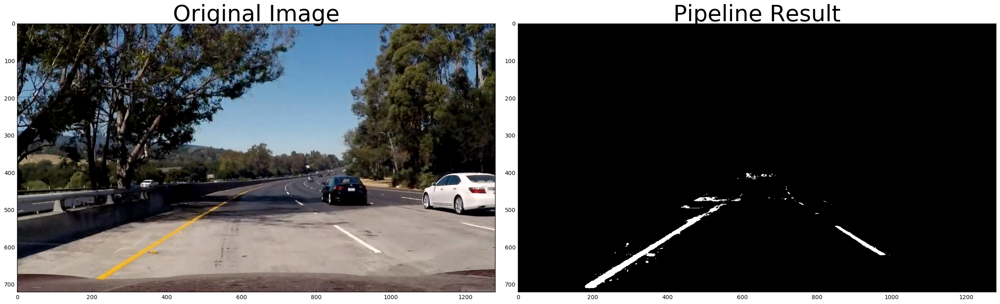

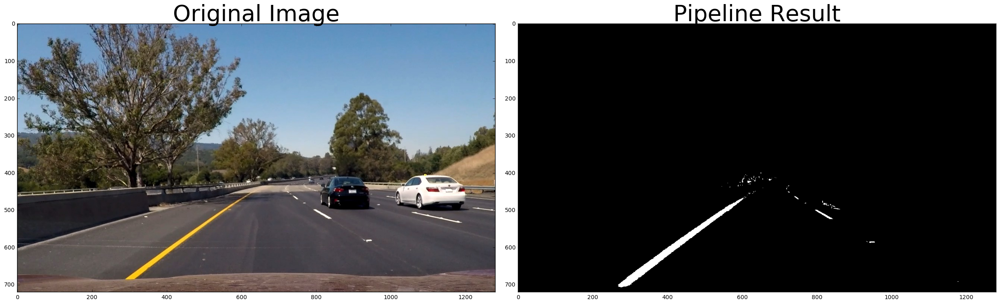

In [7]:
test_image_fnames = glob.glob('test_images/test*.jpg')
for fname in test_image_fnames:
    img,gray = imread_and_grayscale(fname,'mpimg')
    # Distortion Correction 
    undistorted = cal_undistort(img,mtx,dist)

    # Color/Gradient Threshold
    result = pipeline(undistorted)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Save Binary Combo Image

True

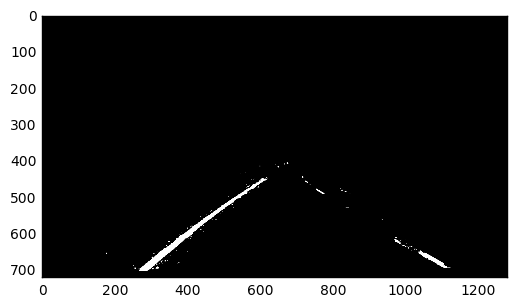

In [8]:
img,gray = imread_and_grayscale('test_images/test1.jpg','mpimg')

# Distortion Correction 
undistorted = cal_undistort(img,mtx,dist)
# Color/Gradient Threshold
result = pipeline(undistorted)
#vis = np.concatenate((img, result), axis=1)
plt.imshow(result,cmap='gray')
cv2.imwrite('./output_images/binary_combo_example.png', result)    
    


# Warping

In [9]:
"""
Given img, returns img with perspective transformed
"""
img_size = (img.shape[1],img.shape[0])
src = np.float32([
    [200,700],
    [600,450],
    [700,450],
    [1100,700]
])
dst = np.float32([
        [375,700],
        [375,0],
        [875,0],
        [875,700]
    ])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

def warp(img):

    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

# Original -> Warped

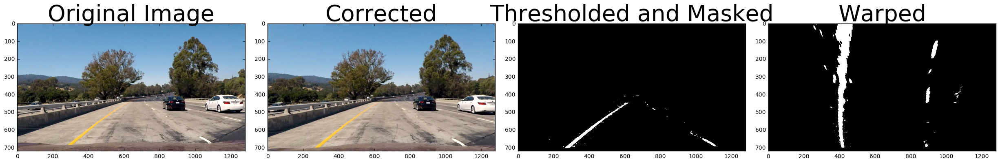

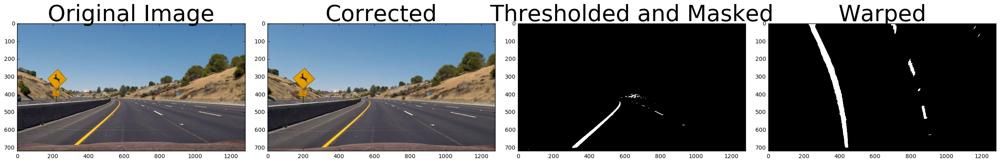

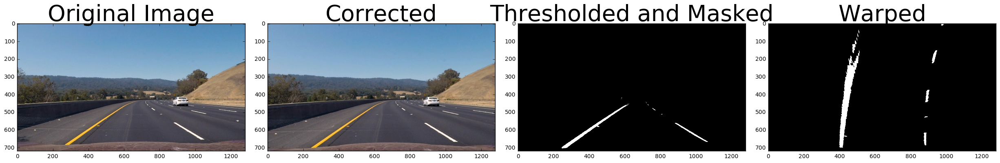

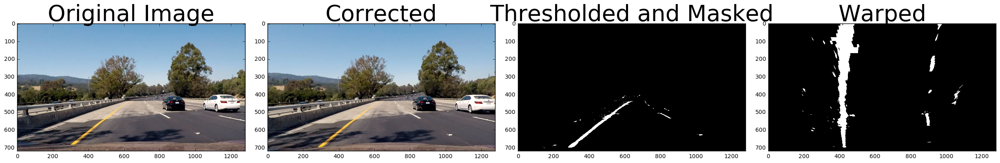

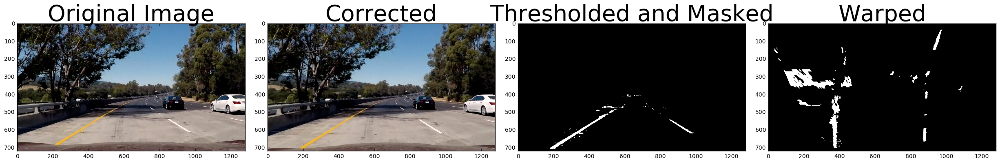

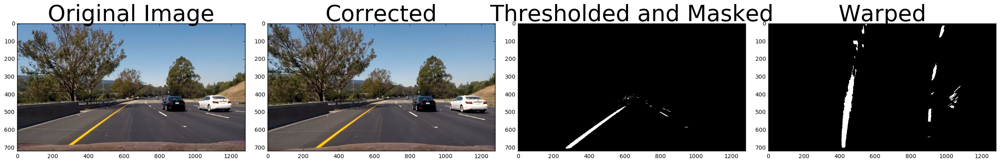

In [10]:
test_image_fnames = glob.glob('test_images/test*.jpg')
for fname in test_image_fnames:
    img,gray = imread_and_grayscale(fname,'mpimg')
    # Distortion Correction 
    undistorted = cal_undistort(img,mtx,dist)

    # Color/Gradient Threshold
    thresholded = pipeline(undistorted)

    # Warp
    warped = warp(thresholded)

    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(undistorted,cmap='gray')
    ax2.set_title('Corrected', fontsize=40)

    ax3.imshow(thresholded,cmap='gray')
    ax3.set_title('Thresholded and Masked', fontsize=40)

    ax4.imshow(warped,cmap='gray')
    ax4.set_title('Warped', fontsize=40)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Find Lanes

In [11]:
def find_line_with_window(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty

In [12]:

def find_lane_without_window(binary_warped,left_fit,right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty

# Calculate Curvature

In [13]:
def curvature(leftx,rightx,ploty):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad,right_curverad



# Calculate Centers


In [14]:
def center(warped,left_fix,right_fitx):
    """
    calc offset right of center in meters
    """
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    image_middle = warped.shape[1] / 2
    lane_middle = (left_fitx[0] + right_fitx[0]) / 2
    return (lane_middle-image_middle)*xm_per_pix

# Draw lanes

In [15]:
def draw_poly(image, warped, yvals, left_fitx, right_fitx, Minv, curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature [Left Lane]: {} m".format(round(curvature,4))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    
    c = center(warped,left_fitx,right_fitx)
    text = "Distance From Center (to the right): {} m".format(round(c,4))
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result



# Putting it all together

In [16]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
    
    def append_to_current_fit(self,fit):
        """
        Append to self.current_fit while maintaining a max num items of 10.
        Updates self.best_fit when current_fit updates
        """
        if len(self.current_fit) > 10:
            self.current_fit = self.current_fit[1:]
        
        self.current_fit.append(fit)
        self.best_fit = np.mean(self.current_fit,0) 
    
    def append_to_fitx(self,fitx):
        """
        Append to self.recent_xfitted while maintaining a max num items of 10.
        Updates self.best_fitx when recent_xfitted updates
        """
        if len(self.recent_xfitted) > 10:
            self.recent_xfitted = self.recent_xfitted[1:]

        self.recent_xfitted.append(fitx)
        self.best_fitx = np.mean(self.recent_xfitted,0) 

def update_line(line,fit_x,fit,new_radius_of_curvature):
    
    # Checking that they have similar curvature
    
    # If previous line was detected, then perform some comparisons between previous and new line
    if line.detected:
        # Check if radius of curvature is similar
        new_to_old_curvature_ratio = abs((new_radius_of_curvature - line.radius_of_curvature)/line.radius_of_curvature)
        if new_to_old_curvature_ratio < .5: # tune this parameter
            line.detected = True
            line.append_to_current_fit(fit)
            line.append_to_fitx(fit_x)
            line.radius_of_curvature = new_radius_of_curvature
        else:
            line.detected = False
    else:
        line.detected = True
        line.append_to_current_fit(fit)
        line.append_to_fitx(fit_x)        
        line.radius_of_curvature = new_radius_of_curvature 
            
    # returns the "best" points (either current, or previous)
    return line.best_fitx

In [17]:
 
def process_image(img):
    # Distortion Correction 
    undistorted = cal_undistort(img,mtx,dist)
    # Color/Gradient Threshold
    thresholded = pipeline(undistorted)
    # Warp
    warped = warp(thresholded)
    
    
    # If no previous lines detected, do the ful window detection method
    if (not left.detected) or (not right.detected) :
        left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty = find_line_with_window(warped)
    else:
        # Otherwise, use the previous lines to narrow the search space
        left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty = find_lane_without_window(warped,left.best_fit,right.best_fit)            
    
    curve = curvature(left_fitx,right_fitx,ploty)
    if (abs(left_fitx - right_fitx)<4).all() and abs(curve[0]/curve[1] - 1) < 2:            
        left_fitx_final = update_line(left,left_fitx,left_fit,curve[0])
        right_fitx_final = update_line(right,right_fitx,right_fit,curve[1])        
    else:
        left.detected = False
        right.detected = False
        left_fitx_final = left.recent_xfitted[-1]
        right_fitx_final = right.recent_xfitted[-1]
            
    return draw_poly(img,warped,ploty,left_fitx_final,right_fitx_final,Minv,left.radius_of_curvature)
  


# Original  -> Highlighted Lanes

# Save warped with line drawn

//anaconda/envs/TestEnv/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


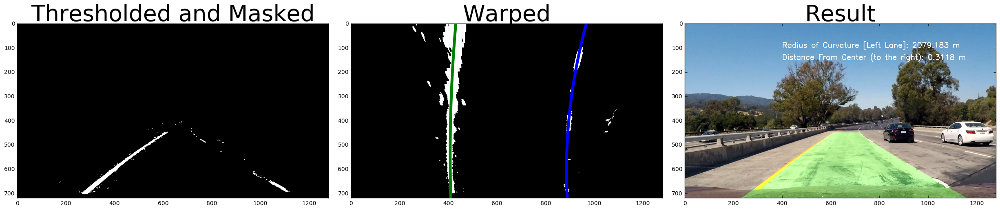

In [18]:
img,gray = imread_and_grayscale('test_images/test1.jpg','mpimg')

# Distortion Correction 
undistorted = cal_undistort(img,mtx,dist)

# Color/Gradient Threshold
thresholded = pipeline(undistorted)

# Warp
warped = warp(thresholded)

# Processed
left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty = find_line_with_window(warped)

curve = curvature(left_fitx,right_fitx,ploty)
processed = draw_poly(img,warped,ploty,left_fitx,right_fitx,Minv,curve[0])

# Plot the result
f, (ax3, ax4, ax5) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()

ax3.imshow(thresholded,cmap='gray')
ax3.set_title('Thresholded and Masked', fontsize=40)

ax4.plot(left_fitx, ploty, color='green', linewidth=5)
ax4.plot(right_fitx, ploty, color='blue', linewidth=5)
ax4.imshow(warped, cmap='gray')
ax4.set_title('Warped', fontsize=40)

ax5.imshow(processed)
ax5.set_title('Result', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig('./output_images/color_fit_lines.png')

//anaconda/envs/TestEnv/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


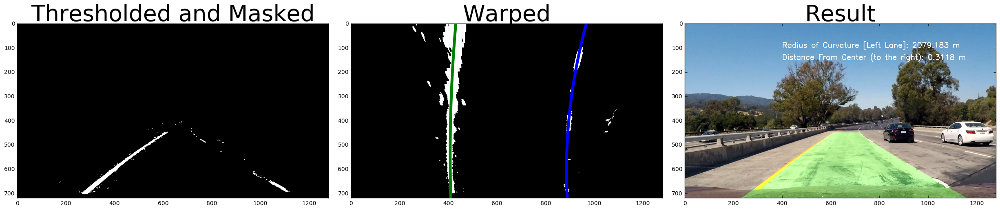

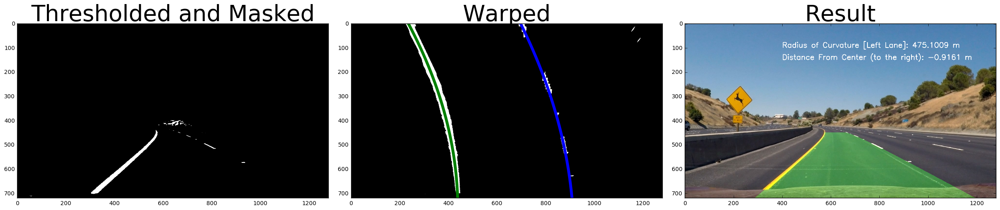

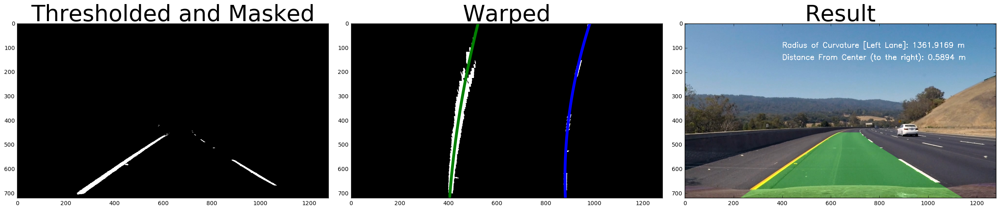

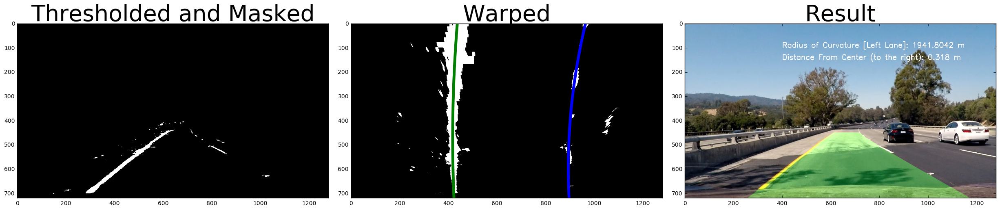

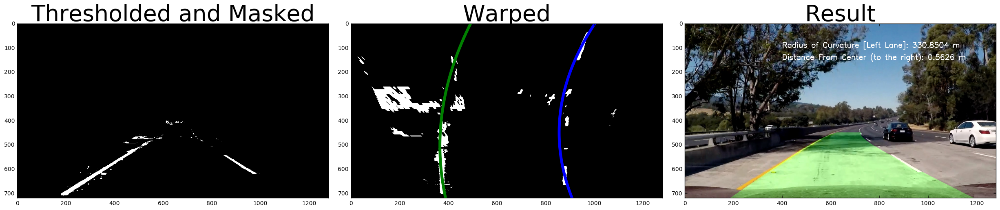

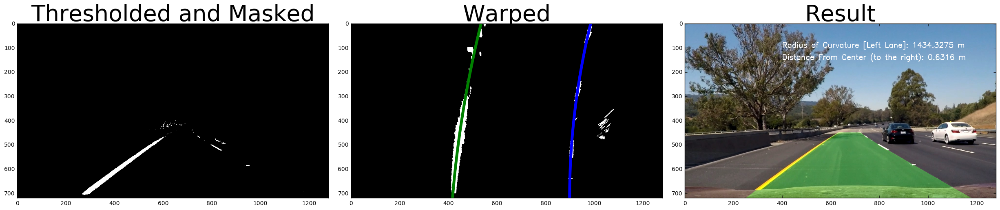

In [19]:
test_image_fnames = glob.glob('test_images/test*.jpg')
for fname in test_image_fnames:
    
    img,gray = imread_and_grayscale(fname,'mpimg')
    # Distortion Correction 
    undistorted = cal_undistort(img,mtx,dist)

    # Color/Gradient Threshold
    thresholded = pipeline(undistorted)

    # Warp
    warped = warp(thresholded)
    
    # Processed
    left_fitx,right_fitx,left_fit,right_fit,left_lane_inds,right_lane_inds,ploty = find_line_with_window(warped)

    curve = curvature(left_fitx,right_fitx,ploty)
    processed = draw_poly(img,warped,ploty,left_fitx,right_fitx,Minv,curve[0])

    # Plot the result
    f, (ax3, ax4,ax5) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax3.imshow(thresholded,cmap='gray')
    ax3.set_title('Thresholded and Masked', fontsize=40)

    ax4.plot(left_fitx, ploty, color='green', linewidth=5)
    ax4.plot(right_fitx, ploty, color='blue', linewidth=5)
    ax4.imshow(warped, cmap='gray')
    ax4.set_title('Warped', fontsize=40)
    
    ax5.imshow(processed)
    ax5.set_title('Result', fontsize=40)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



# Video

In [ ]:
### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# Set up lines for left and right
left = Line()
right = Line()
white_output = 'white.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)